# Capstone Project - Ocular Disease Recognition

## Information

**Data 1 Source:** <br>
https://www.kaggle.com/datasets/andrewmvd/ocular-disease-recognition-odir5k

**About Dataset:** <br>
Ocular Disease Intelligent Recognition (ODIR) is a structured ophthalmic database of 5,000 patients with age, color fundus photographs from left and right eyes and doctors' diagnostic keywords from doctors.

This dataset is meant to represent ‘‘real-life’’ set of patient information collected by Shanggong Medical Technology Co., Ltd. from different hospitals/medical centers in China. In these institutions, fundus images are captured by various cameras in the market, such as Canon, Zeiss and Kowa, resulting into varied image resolutions.
Annotations were labeled by trained human readers with quality control management. They classify patient into eight labels including:

*   Normal (N)
*   Diabetes (D)
*   Glaucoma (G)
*   Cataract (C)
*   Age related Macular Degeneration (A),
*   Hypertension (H),
*   Pathological Myopia (M),
*   Other diseases/abnormalities (O)


**Data 2 Source:** <br>
https://www.kaggle.com/datasets/jr2ngb/cataractdataset

**About Dataset:** <br>
Cataract and normal eye image dataset for cataract detection.

**Data 3 Source:** <br>
https://www.kaggle.com/datasets/sshikamaru/glaucoma-detection

**About Dataset:** <br>
Glaucoma is a group of eye conditions that damage the optic nerve, the health of which is vital for good vision. This damage is often caused by an abnormally high pressure in your eye. Glaucoma is one of the leading causes of blindness for people over the age of 60.


## Environment Setup

### Mount Drive

In [ ]:
# Load the Drive helper and mount
from google.colab import drive

# This will prompt for authorization
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Import Libraries

In [ ]:
# Run this code before run any cell below
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras.layers import Flatten, Dense, Conv2D, MaxPooling2D
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2 
from tensorflow.keras.applications import MobileNetV3Small
from tensorflow.keras.applications.inception_v3 import InceptionV3

from keras.preprocessing.image import ImageDataGenerator

import pandas as pd

import cv2
import cv2 as cv

import numpy as np

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import os
from os import listdir

from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.utils.class_weight import compute_class_weight
from sklearn.utils import class_weight 

### Import CSV as Pandas DataFrame (Data 1)

In [ ]:
# Import data label CSV
df = pd.read_csv('/content/drive/MyDrive/Capstone Project/archive/full_df.csv')

# Show all data
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', 199)
display(df)

,ID,Patient Age,Patient Sex,Left-Fundus,Right-Fundus,Left-Diagnostic Keywords,Right-Diagnostic Keywords,N,D,G,C,A,H,M,O,filepath,labels,target,filename
0,0,69,Female,0_left.jpg,0_right.jpg,cataract,normal fundus,0,0,0,1,0,0,0,0,../input/ocular-disease-recognition-odir5k/ODIR-5K/Training Images/0_right.jpg,['N'],"[1, 0, 0, 0, 0, 0, 0, 0]",0_right.jpg
1,1,57,Male,1_left.jpg,1_right.jpg,normal fundus,normal fundus,1,0,0,0,0,0,0,0,../input/ocular-disease-recognition-odir5k/ODIR-5K/Training Images/1_right.jpg,['N'],"[1, 0, 0, 0, 0, 0, 0, 0]",1_right.jpg
2,2,42,Male,2_left.jpg,2_right.jpg,laser spot，moderate non proliferative retinopathy,moderate non proliferative retinopathy,0,1,0,0,0,0,0,1,../input/ocular-disease-recognition-odir5k/ODIR-5K/Training Images/2_right.jpg,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",2_right.jpg
3,4,53,Male,4_left.jpg,4_right.jpg,macular epiretinal membrane,mild nonproliferative retinopathy,0,1,0,0,0,0,0,1,../input/ocular-disease-recognition-odir5k/ODIR-5K/Training Images/4_right.jpg,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",4_right.jpg
4,5,50,Female,5_left.jpg,5_right.jpg,moderate non proliferative retinopathy,moderate non proliferative retinopathy,0,1,0,0,0,0,0,0,../input/ocular-disease-recognition-odir5k/ODIR-5K/Training Images/5_right.jpg,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",5_right.jpg
5,6,60,Male,6_left.jpg,6_right.jpg,macular epiretinal membrane,moderate non proliferative retinopathy，epiretinal membrane,0,1,0,0,0,0,0,1,../input/ocular-disease-recognition-odir5k/ODIR-5K/Training Images/6_right.jpg,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",6_right.jpg
6,7,60,Female,7_left.jpg,7_right.jpg,drusen,mild nonproliferative retinopathy,0,1,0,0,0,0,0,1,../input/ocular-disease-recognition-odir5k/ODIR-5K/Training Images/7_right.jpg,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",7_right.jpg
7,8,59,Male,8_left.jpg,8_right.jpg,normal fundus,normal fundus,1,0,0,0,0,0,0,0,../input/ocular-disease-recognition-odir5k/ODIR-5K/Training Images/8_right.jpg,['N'],"[1, 0, 0, 0, 0, 0, 0, 0]",8_right.jpg
8,9,54,Male,9_left.jpg,9_right.jpg,normal fundus,vitreous degeneration,0,0,0,0,0,0,0,1,../input/ocular-disease-recognition-odir5k/ODIR-5K/Training Images/9_right.jpg,['O'],"[0, 0, 0, 0, 0, 0, 0, 1]",9_right.jpg
9,10,70,Male,10_left.jpg,10_right.jpg,epiretinal membrane,normal fundus,0,0,0,0,0,0,0,1,../input/ocular-disease-recognition-odir5k/ODIR-5K/Training Images/10_right.jpg,['N'],"[1, 0, 0, 0, 0, 0, 0, 0]",10_right.jpg


In [ ]:
# Dataframe slicing for filename and labels
df_1 = df.loc[:, ['filename','labels']]
display(df_1)

,filename,labels
0,0_right.jpg,['N']
1,1_right.jpg,['N']
2,2_right.jpg,['D']
3,4_right.jpg,['D']
4,5_right.jpg,['D']
5,6_right.jpg,['D']
6,7_right.jpg,['D']
7,8_right.jpg,['N']
8,9_right.jpg,['O']
9,10_right.jpg,['N']


### Assign Pre-Trained Models

In [ ]:
image_size = 512

vgg = VGG19(weights="imagenet",include_top = False,input_shape=(image_size,image_size,3))
mobilenetv2 = MobileNetV2(weights="imagenet",include_top = False,input_shape=(image_size,image_size,3))
mobilenetv3small = MobileNetV3Small(weights="imagenet",include_top = False,input_shape=(image_size,image_size,3))

for layer in vgg.layers:
  layer.trainable = False

for layer in mobilenetv2.layers:
  layer.trainable = False

for layer in mobilenetv3small.layers:
  layer.trainable = False

In [ ]:
# Download the pre-trained weights. No top means it excludes the fully connected layer it uses for classification.
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5 \
    -O /tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5

--2022-06-10 14:38:16--  https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
Resolving storage.googleapis.com (storage.googleapis.com)... 172.217.9.208, 142.251.16.128, 142.250.73.240, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|172.217.9.208|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 87910968 (84M) [application/x-hdf]
Saving to: ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’

/tmp/inception_v3_w 100%[===================>]  83.84M   225MB/s    in 0.4s    

2022-06-10 14:38:17 (225 MB/s) - ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’ saved [87910968/87910968]



In [ ]:
# Set the weights file you downloaded into a variable
local_weights_file = '/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'

# Initialize the base model.
# Set the input shape and remove the dense layers.
pre_trained_model = InceptionV3(input_shape = (512, 512, 3), 
                                include_top = False, 
                                weights = None)

# Load the pre-trained weights you downloaded.
pre_trained_model.load_weights(local_weights_file)

# Freeze the weights of the layers.
for layer in pre_trained_model.layers:
  layer.trainable = False

### User Defined Function to Preprocess Image

In [ ]:
def to_grayscale_then_rgb(image):
    image = tf.image.rgb_to_grayscale(image)
    image = tf.image.grayscale_to_rgb(image)
    return image

### Assign Directory & Data Checking

In [ ]:
# assign directory
directory_1 = '/content/drive/MyDrive/Capstone Project/archive/preprocessed_images'
directory_23_C =  '/content/drive/MyDrive/Capstone Project/dataset/cataract'
directory_23_G =  '/content/drive/MyDrive/Capstone Project/dataset/glaucoma'
directory_23_N =  '/content/drive/MyDrive/Capstone Project/dataset/normal'
 
# Create buffer variable and iterate over files in that directory
dir_1_counter = 0
dir_23_counter = 0

# Counting data
for image_name in os.listdir(directory_1):
  dir_1_counter += 1

for image_name in os.listdir(directory_23_C):
  dir_23_counter += 1

for image_name in os.listdir(directory_23_G):
  dir_23_counter += 1

for image_name in os.listdir(directory_23_N):
  dir_23_counter += 1

print('Total Images in Data 1   :', dir_1_counter)
print('Total Images in Data 2&3 :', dir_23_counter)

Total Images in Data 1   : 6392
Total Images in Data 2&3 : 669


### Create New DataFrame from Data 2&3

In [ ]:
# Collect filename and label from directory
filenames = []
labels = []

for image_name in os.listdir(directory_23_C):
  filenames.append('/content/drive/MyDrive/Capstone Project/dataset/cataract/'+image_name)
  labels.append("['C']")

for image_name in os.listdir(directory_23_G):
  filenames.append('/content/drive/MyDrive/Capstone Project/dataset/glaucoma/'+image_name)
  labels.append("['G']")

for image_name in os.listdir(directory_23_N):
  filenames.append('/content/drive/MyDrive/Capstone Project/dataset/normal/'+image_name)
  labels.append("['N']")

In [ ]:
# Create New DataFrame
df_23 = pd.DataFrame({'filename': filenames, 'labels': labels})
display(df_23)

,filename,labels
0,/content/drive/MyDrive/Capstone Project/dataset/cataract/cataract_010.png,['C']
1,/content/drive/MyDrive/Capstone Project/dataset/cataract/cataract_005.png,['C']
2,/content/drive/MyDrive/Capstone Project/dataset/cataract/cataract_001.png,['C']
3,/content/drive/MyDrive/Capstone Project/dataset/cataract/cataract_009.png,['C']
4,/content/drive/MyDrive/Capstone Project/dataset/cataract/cataract_003.png,['C']
5,/content/drive/MyDrive/Capstone Project/dataset/cataract/cataract_012.png,['C']
6,/content/drive/MyDrive/Capstone Project/dataset/cataract/cataract_004.png,['C']
7,/content/drive/MyDrive/Capstone Project/dataset/cataract/cataract_008.png,['C']
8,/content/drive/MyDrive/Capstone Project/dataset/cataract/cataract_002.png,['C']
9,/content/drive/MyDrive/Capstone Project/dataset/cataract/cataract_006.png,['C']


### Data Distribution Before Merge Dataset

In [ ]:
# Dataframe slicing (Cataract)
df_cat = df_23.loc[df_23['labels'] == "['C']", ['filename','labels']]

# Dataframe slicing (Glaucoma)
df_gl = df_23.loc[df_23['labels'] == "['G']", ['filename','labels']]

# Dataframe slicing (Normal)
df_norm = df_23.loc[df_23['labels'] == "['N']", ['filename','labels']]

print('Cataract : ',df_cat.shape[0])
print('Normal   : ',df_norm.shape[0])
print('Glaucoma : ',df_gl.shape[0])

Cataract :  100
Normal   :  300
Glaucoma :  269


### Upscaling Dataset 2&3 with Random Data from Data 1 to Avoid Imbalanced Dataset

In [ ]:
# Sampling data from data 1
# df_C_1 = df_1[df_1.labels == "['C']"].sample(200, random_state=42)
# filename_c = df_C_1['filename'].values
# labels_c = df_C_1['labels'].values

# df_G_1 = df_1[df_1.labels == "['G']"].sample(31, random_state=42)
# filename_g = df_G_1['filename'].values
# labels_g = df_G_1['labels'].values

df_C_1 = df_1[df_1.labels == "['C']"].sample(250, random_state=42)
filename_c = df_C_1['filename'].values
labels_c = df_C_1['labels'].values

df_N_1 = df_1[df_1.labels == "['N']"].sample(50, random_state=42)
filename_n = df_N_1['filename'].values
labels_n = df_N_1['labels'].values

df_G_1 = df_1[df_1.labels == "['G']"].sample(81, random_state=42)
filename_g = df_G_1['filename'].values
labels_g = df_G_1['labels'].values

In [ ]:
# Append file directory to filename
#for x in range(len(filename_c)):
#  filename_c[x] = directory_1 + '/' + filename_c[x]

#for x in range(len(filename_g)):
#  filename_g[x] = directory_1 + '/' + filename_g[x]

# Append file directory to filename
for x in range(len(filename_c)):
  filename_c[x] = directory_1 + '/' + filename_c[x]

for x in range(len(filename_n)):
  filename_n[x] = directory_1 + '/' + filename_n[x]

for x in range(len(filename_g)):
  filename_g[x] = directory_1 + '/' + filename_g[x]

In [ ]:
# Create DataFrame from Data 1 Sample
# df_sample_1 = pd.DataFrame({'filename':np.concatenate((filename_c, filename_g)), 'labels':np.concatenate((labels_c, labels_g))})
# df_sample_1.tail()

# Create DataFrame from Data 1 Sample
df_sample_1 = pd.DataFrame({'filename':np.concatenate((filename_c, filename_n, filename_g)), 'labels':np.concatenate((labels_c, labels_n, labels_g))})
df_sample_1.head()

,filename,labels
0,/content/drive/MyDrive/Capstone Project/archive/preprocessed_images/2173_right.jpg,['C']
1,/content/drive/MyDrive/Capstone Project/archive/preprocessed_images/2204_left.jpg,['C']
2,/content/drive/MyDrive/Capstone Project/archive/preprocessed_images/2116_right.jpg,['C']
3,/content/drive/MyDrive/Capstone Project/archive/preprocessed_images/1452_left.jpg,['C']
4,/content/drive/MyDrive/Capstone Project/archive/preprocessed_images/0_left.jpg,['C']


In [ ]:
df_merged = pd.concat([df_23, df_sample_1], ignore_index=True)
df_merged

,filename,labels
0,/content/drive/MyDrive/Capstone Project/dataset/cataract/cataract_010.png,['C']
1,/content/drive/MyDrive/Capstone Project/dataset/cataract/cataract_005.png,['C']
2,/content/drive/MyDrive/Capstone Project/dataset/cataract/cataract_001.png,['C']
3,/content/drive/MyDrive/Capstone Project/dataset/cataract/cataract_009.png,['C']
4,/content/drive/MyDrive/Capstone Project/dataset/cataract/cataract_003.png,['C']
5,/content/drive/MyDrive/Capstone Project/dataset/cataract/cataract_012.png,['C']
6,/content/drive/MyDrive/Capstone Project/dataset/cataract/cataract_004.png,['C']
7,/content/drive/MyDrive/Capstone Project/dataset/cataract/cataract_008.png,['C']
8,/content/drive/MyDrive/Capstone Project/dataset/cataract/cataract_002.png,['C']
9,/content/drive/MyDrive/Capstone Project/dataset/cataract/cataract_006.png,['C']


### Data Distribution After Merge Dataset

In [ ]:
# Dataframe slicing (Cataract)
df_cat = df_merged.loc[df_merged['labels'] == "['C']", ['filename','labels']]

# Dataframe slicing (Glaucoma)
df_gl = df_merged.loc[df_merged['labels'] == "['G']", ['filename','labels']]

# Dataframe slicing (Normal)
df_norm = df_merged.loc[df_merged['labels'] == "['N']", ['filename','labels']]

print('Cataract : ',df_cat.shape[0])
print('Normal   : ',df_norm.shape[0])
print('Glaucoma : ',df_gl.shape[0])

Cataract :  350
Normal   :  350
Glaucoma :  350


### Shuffle Dataset

In [ ]:
df_merged = shuffle(df_merged, random_state=42).reset_index(drop=True)
df_merged

,filename,labels
0,/content/drive/MyDrive/Capstone Project/dataset/glaucoma/645.jpg,['G']
1,/content/drive/MyDrive/Capstone Project/archive/preprocessed_images/2225_right.jpg,['C']
2,/content/drive/MyDrive/Capstone Project/dataset/normal/NL_127.png,['N']
3,/content/drive/MyDrive/Capstone Project/dataset/normal/NL_029.png,['N']
4,/content/drive/MyDrive/Capstone Project/dataset/cataract/cataract_026.png,['C']
5,/content/drive/MyDrive/Capstone Project/dataset/normal/NL_073.png,['N']
6,/content/drive/MyDrive/Capstone Project/dataset/glaucoma/Glaucoma_094.png,['G']
7,/content/drive/MyDrive/Capstone Project/dataset/normal/NL_066.png,['N']
8,/content/drive/MyDrive/Capstone Project/dataset/glaucoma/Glaucoma_009.png,['G']
9,/content/drive/MyDrive/Capstone Project/archive/preprocessed_images/2098_right.jpg,['C']


### Train Test Split

In [ ]:
# Split Train and Test from Dataframe
train, val = train_test_split(df_merged, test_size=0.2, random_state=37)

In [ ]:
print('Cataract Train Count: ',train[train['labels']=="['C']"].labels.count())
print('Normal Train Count  : ',train[train['labels']=="['N']"].labels.count())
print('Glaucoma Train Count: ',train[train['labels']=="['G']"].labels.count())
print('Cataract Validation Count: ',val[val['labels']=="['C']"].labels.count())
print('Normal Validation Count  : ',val[val['labels']=="['N']"].labels.count())
print('Glaucoma Validation Count: ',val[val['labels']=="['G']"].labels.count())

Cataract Train Count:  286
Normal Train Count  :  274
Glaucoma Train Count:  280
Cataract Validation Count:  64
Normal Validation Count  :  76
Glaucoma Validation Count:  70


## Model 1

### Image Data Generator

In [ ]:
traingen = ImageDataGenerator(rescale = 1./255.,
                              rotation_range = 40,
                              width_shift_range = 0.2,
                              height_shift_range = 0.2,
                              shear_range = 0.2,
                              zoom_range = 0.2,
                              fill_mode = 'nearest',
                              horizontal_flip = True)

train_generator = traingen.flow_from_dataframe(
    train,
    target_size=(512, 512),
    x_col='filename',
    y_col='labels',
    class_mode='categorical',
)

valgen = ImageDataGenerator(rescale=1./255.)

validation_generator = valgen.flow_from_dataframe(
    val,
    target_size=(512, 512),
    x_col='filename',
    y_col='labels',
    class_mode='categorical',
)

Found 840 validated image filenames belonging to 3 classes.
Found 210 validated image filenames belonging to 3 classes.


### Add Layers

In [ ]:
model = Sequential()
model.add(mobilenetv2)
model.add(Conv2D(128, (3,3), activation='relu'))
model.add(MaxPooling2D(2,2))
model.add(Flatten())
model.add(Dense(128, activation="relu"))
model.add(Dense(64, activation="relu"))
model.add(Dense(32, activation="relu"))
model.add(Dense(3, activation="softmax"))

# Print the model summary
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Funct  (None, 16, 16, 1280)     2257984   
 ional)                                                          
                                                                 
 conv2d_189 (Conv2D)         (None, 14, 14, 128)       1474688   
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 7, 7, 128)        0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 6272)              0         
                                                                 
 dense_4 (Dense)             (None, 128)               802944    
                                                                 
 dense_5 (Dense)             (None, 64)               

### Compile Model & Callbacks

In [ ]:
model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

checkpoint = ModelCheckpoint("CapstoneModel.h5",monitor="val_accuracy",verbose=1,save_best_only=True,
                             save_weights_only=False,period=1)
earlystop = EarlyStopping(monitor="val_accuracy",patience=10,verbose=1)

### Training Model

In [ ]:
# Train the model
history = model.fit(train_generator,
                    validation_data = validation_generator,
                    epochs=20,
                    batch_size=10,
                    callbacks=[checkpoint,earlystop],
                    verbose = 1)

Epoch 1/20
27/27 [==============================] - ETA: 0s - loss: 1.4141 - accuracy: 0.5548
Epoch 1: val_accuracy improved from -inf to 0.78095, saving model to CapstoneModel.h5
27/27 [==============================] - 146s 5s/step - loss: 1.4141 - accuracy: 0.5548 - val_loss: 0.6113 - val_accuracy: 0.7810
Epoch 2/20
27/27 [==============================] - ETA: 0s - loss: 0.5779 - accuracy: 0.7500
Epoch 2: val_accuracy improved from 0.78095 to 0.79524, saving model to CapstoneModel.h5
27/27 [==============================] - 102s 4s/step - loss: 0.5779 - accuracy: 0.7500 - val_loss: 0.5659 - val_accuracy: 0.7952
Epoch 3/20
27/27 [==============================] - ETA: 0s - loss: 0.5030 - accuracy: 0.8060
Epoch 3: val_accuracy did not improve from 0.79524
27/27 [==============================] - 102s 4s/step - loss: 0.5030 - accuracy: 0.8060 - val_loss: 0.5592 - val_accuracy: 0.7333
Epoch 4/20
27/27 [==============================] - ETA: 0s - loss: 0.5107 - accuracy: 0.7762
Epoch 4:

### Accuracy & Loss Graph

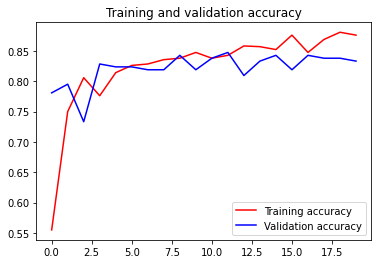

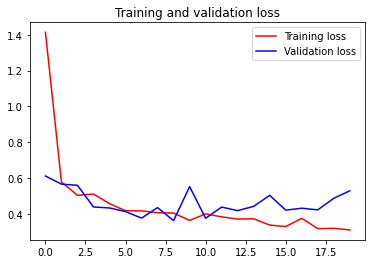

<Figure size 432x288 with 0 Axes>

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend(loc=0)
plt.figure()

plt.show()

In [ ]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

import pathlib

tflite_model_file = pathlib.Path('model2.tflite')
tflite_model_file.write_bytes(tflite_model)

INFO:tensorflow:Assets written to: /tmp/tmpa_2aq0_i/assets


INFO:tensorflow:Assets written to: /tmp/tmpa_2aq0_i/assets


18023344

In [ ]:
!pip3 install --extra-index-url https://google-coral.github.io/py-repo/ tflite_runtime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/, https://google-coral.github.io/py-repo/
     |████████████████████████████████| 2.2 MB 21.4 MB/s 


In [ ]:
interpreter = tf.lite.Interpreter(model_content=tflite_model)
#allocate the tensors
interpreter.allocate_tensors()

In [ ]:
#get input and output tensors
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

In [ ]:
import cv2
# Read the image and decode to a tensor
image_path='cataract.jpg' 
img = cv2.imread(image_path)
img = cv2.resize(img,(512,512))
#Preprocess the image to required size and cast
input_shape = input_details[0]['shape']
input_tensor= np.array(np.expand_dims(img,0), dtype=np.float32)

In [ ]:
#set the tensor to point to the input data to be inferred
input_index = interpreter.get_input_details()[0]["index"]
interpreter.set_tensor(input_index, input_tensor)
#Run the inference
interpreter.invoke()
output_details = interpreter.get_output_details()

In [ ]:
output_data = interpreter.get_tensor(output_details[0]['index'])
results = np.squeeze(output_data)
top_k = results.argsort()
print(results)

[0.02466066 0.07132775 0.90401155]


## Model 2

### Image Data Generator

In [ ]:
traingen = ImageDataGenerator(rescale = 1./255.,
                              rotation_range = 40,
                              width_shift_range = 0.2,
                              height_shift_range = 0.2,
                              shear_range = 0.2,
                              zoom_range = 0.2,
                              fill_mode = 'nearest',
                              horizontal_flip = True)

train_generator = traingen.flow_from_dataframe(
    train,
    target_size=(512, 512),
    x_col='filename',
    y_col='labels',
    class_mode='categorical',
)

valgen = ImageDataGenerator(rescale=1./255.)

validation_generator = valgen.flow_from_dataframe(
    val,
    target_size=(512, 512),
    x_col='filename',
    y_col='labels',
    class_mode='categorical',
)

Found 720 validated image filenames belonging to 3 classes.
Found 180 validated image filenames belonging to 3 classes.


### Add Layers

In [ ]:
model = Sequential()
model.add(mobilenetv2)
model.add(Conv2D(128, (3,3), activation='relu'))
model.add(MaxPooling2D(2,2))
model.add(Flatten())
model.add(Dense(128, activation="relu"))
model.add(Dense(64, activation="relu"))
model.add(Dense(32, activation="relu"))
model.add(Dense(3, activation="softmax"))

# Print the model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Funct  (None, 16, 16, 1280)     2257984   
 ional)                                                          
                                                                 
 conv2d_94 (Conv2D)          (None, 14, 14, 128)       1474688   
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 7, 7, 128)        0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 6272)              0         
                                                                 
 dense (Dense)               (None, 128)               802944    
                                                                 
 dense_1 (Dense)             (None, 64)                8

### Compile Model & Callbacks

In [ ]:
model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

checkpoint = ModelCheckpoint("CapstoneModel.h5",monitor="val_accuracy",verbose=1,save_best_only=True,
                             save_weights_only=False,period=1)
earlystop = EarlyStopping(monitor="val_accuracy",patience=10,verbose=1)

### Training Model

In [ ]:
# Train the model
history = model.fit(train_generator,
                    validation_data = validation_generator,
                    epochs=20,
                    batch_size=10,
                    callbacks=[checkpoint,earlystop],
                    verbose = 1)

Epoch 1/20
23/23 [==============================] - ETA: 0s - loss: 1.6207 - accuracy: 0.6083 
Epoch 1: val_accuracy improved from -inf to 0.75556, saving model to CapstoneModel.h5
23/23 [==============================] - 701s 30s/step - loss: 1.6207 - accuracy: 0.6083 - val_loss: 0.6287 - val_accuracy: 0.7556
Epoch 2/20
23/23 [==============================] - ETA: 0s - loss: 0.5725 - accuracy: 0.7736
Epoch 2: val_accuracy did not improve from 0.75556
23/23 [==============================] - 95s 4s/step - loss: 0.5725 - accuracy: 0.7736 - val_loss: 0.5755 - val_accuracy: 0.7444
Epoch 3/20
23/23 [==============================] - ETA: 0s - loss: 0.4824 - accuracy: 0.8000
Epoch 3: val_accuracy improved from 0.75556 to 0.82778, saving model to CapstoneModel.h5
23/23 [==============================] - 96s 4s/step - loss: 0.4824 - accuracy: 0.8000 - val_loss: 0.4836 - val_accuracy: 0.8278
Epoch 4/20
23/23 [==============================] - ETA: 0s - loss: 0.4241 - accuracy: 0.8389
Epoch 4:

### Accuracy & Loss Graph

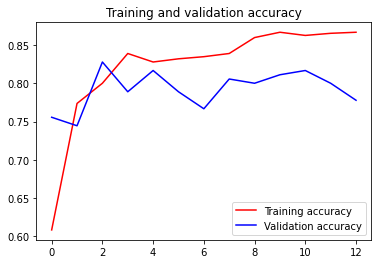

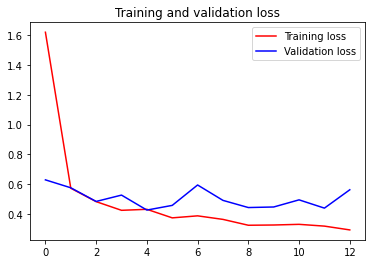

<Figure size 432x288 with 0 Axes>

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend(loc=0)
plt.figure()

plt.show()